# Activity 3.1 Logistic Regression

#### Intended Learning Outcomes (ILOs):
* Demonstrate how to train and predict classification model using logistic regression.
* Demonstrate how to evaluate the performance of the logistic regression.
* Demonstrate how to visualize the performance of the logistic regression.

#### Resources:
* Jupyter Notebook
* Titanic 





#### Procedure:

Import the libraries.

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Load the data using Pandas and check the content of the dataframe

In [4]:
titanic = pd.read_csv(r'C:\Users\Inday\Desktop\Github\DATASCI\CPE 312\module 3\data\Logistic Regression\titanic.csv')

In [5]:
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


Check the missing data. 
Use seaborn to create a simple heatmap to see where  are the missing data

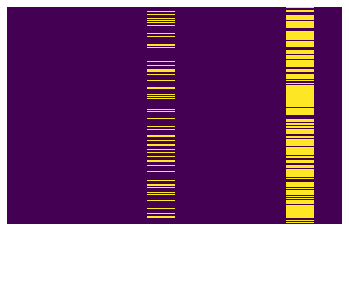

In [6]:
sns.heatmap(titanic.isnull(),yticklabels=False,cbar=False,cmap='viridis');

There are 20% of Age data is missing. We need to replace the missing data with some of imputation. 
The Cabin column are also missing too much of that data. 

Use data visualization to analyze the data

<AxesSubplot:xlabel='Survived', ylabel='count'>

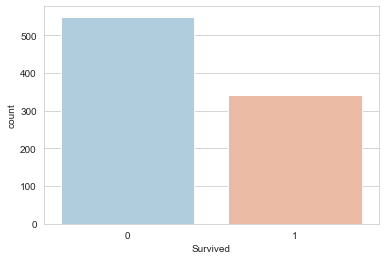

In [7]:
sns.set_style('whitegrid')
sns.countplot(x='Survived',data=titanic,palette='RdBu_r')

Interpret the result of the graph

    it seems that more people died than survived in the sinking of titanic. A little below 350 survived, while a little over 550 died

<AxesSubplot:xlabel='Survived', ylabel='count'>

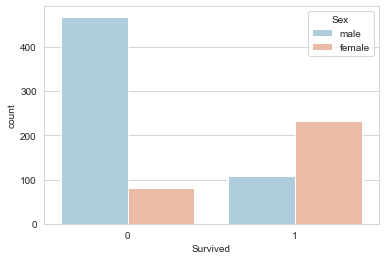

In [8]:
sns.set_style('whitegrid')
sns.countplot(x='Survived',hue='Sex',data=titanic,palette='RdBu_r')

Interpret the result of the graph. 

    Clearly we can see that significantly more men died in the titanic incident than women. The number of women that survived were about twice the amount of men.

<AxesSubplot:xlabel='Survived', ylabel='count'>

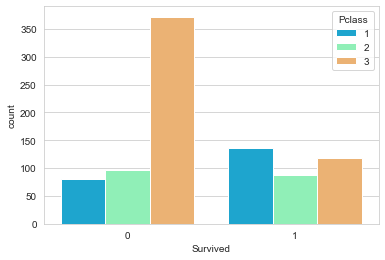

In [9]:
sns.set_style('whitegrid')
sns.countplot(x='Survived',hue='Pclass',data=titanic,palette='rainbow')

Interpret the result. 

    Most of the ones whjo died belong in the (Pclass = 3) group, whereas the least likely to die were the people in the (Pclas = 1), tho not by much 

C:\Users\Inday\Desktop\Github\.venv\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Age'>

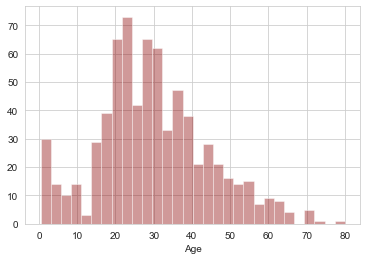

In [10]:
sns.distplot(titanic['Age'].dropna(),kde=False,color='darkred',bins=30)

Interpret the result of the graph. 

Type your answer here

In [11]:
import cufflinks as cf
cf.go_offline()

In [12]:
titanic['Fare'].iplot(kind='hist',bins=30,color='green')

Replace the missing data of the Age column. One way to do this is by filling in the mean age of all the passengers (imputation).


<AxesSubplot:xlabel='Pclass', ylabel='Age'>

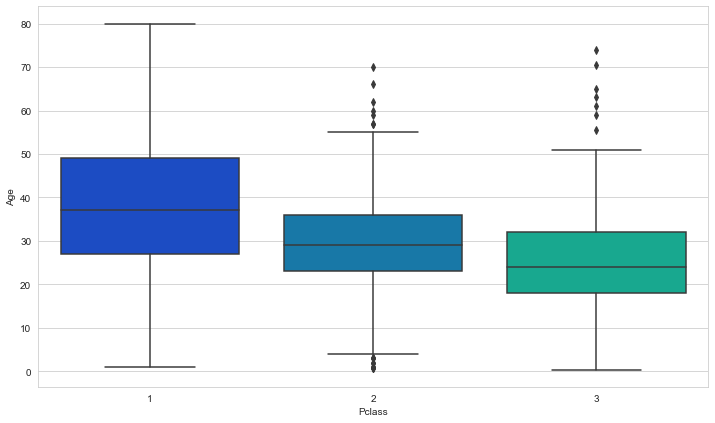

In [13]:
plt.figure(figsize=(12, 7))
sns.boxplot(x='Pclass',y='Age',data=titanic,palette='winter')

In [14]:
#create a function to replace the missing data
def impute_age(cols):
    Age = cols[0]
    Pclass = cols[1]
    
    if pd.isnull(Age):

        if Pclass == 1:
            return 37

        elif Pclass == 2:
            return 29

        else:
            return 24

    else:
        return Age

In [15]:
#apply the function
titanic['Age'] = titanic[['Age','Pclass']].apply(impute_age,axis=1)

<AxesSubplot:>

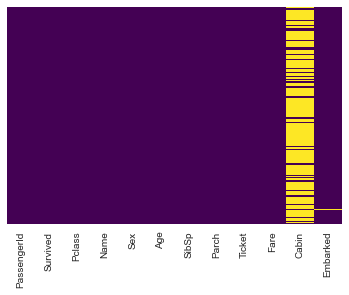

In [16]:
#check the missing data
sns.heatmap(titanic.isnull(),yticklabels=False,cbar=False,cmap='viridis')

Drop the Cabin column and the row in Embarked that is NaN.

In [17]:

titanic.drop('Cabin',axis=1,inplace=True)

In [18]:
titanic.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S


In [19]:
#drop NaN 
titanic.dropna(inplace=True)

Convert categorical features to dummy variables using pandas

In [20]:
titanic.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 889 entries, 0 to 890
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  889 non-null    int64  
 1   Survived     889 non-null    int64  
 2   Pclass       889 non-null    int64  
 3   Name         889 non-null    object 
 4   Sex          889 non-null    object 
 5   Age          889 non-null    float64
 6   SibSp        889 non-null    int64  
 7   Parch        889 non-null    int64  
 8   Ticket       889 non-null    object 
 9   Fare         889 non-null    float64
 10  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(4)
memory usage: 83.3+ KB


In [21]:
sex = pd.get_dummies(titanic['Sex'],drop_first=True)
embark = pd.get_dummies(titanic['Embarked'],drop_first=True)

In [22]:
titanic.drop(['Sex','Embarked','Name','Ticket'],axis=1,inplace=True)
titanic = pd.concat([titanic,sex,embark],axis=1)
titanic.head()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,male,Q,S
0,1,0,3,22.0,1,0,7.2500,1,0,1
1,2,1,1,38.0,1,0,71.2833,0,0,0
2,3,1,3,26.0,0,0,7.9250,0,0,1
3,4,1,1,35.0,1,0,53.1000,0,0,1
4,5,0,3,35.0,0,0,8.0500,1,0,1


Build the Logistic Regression Model

Split the data into a training set and test set

In [23]:
from sklearn.model_selection import train_test_split

In [24]:
from sklearn.linear_model import LogisticRegression

In [25]:
X_train, X_test, y_train, y_test = train_test_split(titanic.drop('Survived',axis=1), 
                                                    titanic['Survived'], test_size=0.30, 
                                                    random_state=101)

Train the model 

In [26]:
from sklearn.linear_model import LogisticRegression

In [27]:
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

C:\Users\Inday\Desktop\Github\.venv\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

Predict the values for the testing data

In [28]:
predictions = logmodel.predict(X_test)

Check precision,recall,f1-score using classification report

In [29]:
from sklearn.metrics import classification_report

In [30]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.79      0.91      0.85       163
           1       0.81      0.62      0.71       104

    accuracy                           0.80       267
   macro avg       0.80      0.77      0.78       267
weighted avg       0.80      0.80      0.79       267



Interpret the precision, recall f1-score

* Precision is the ratio of True Positives to the sum amount of True Positives and False Positives. The precision for the target values 0 and 1 is close in value.
* The recall value describes the ability of the classifier to find all of the positives. Its formula is (True Positives / True Positives + False Negatives). The target variable "1" has the higher recall value compared to the variable "0". For class 1, it seems that the model predicted a lot of False Negatives or predicted a lot of people who died even the though they were alive.
* The F1-score is a harmonic mean of precision and recall. It is a measure of how well the classifier is able to predict each class. Here it seems that the model is able to predict the class, "0", than "1".

Evaluate the accuracy and confusion matrix of the model

* The accuracy of 0.79775 is a percentage value that is described as the ratio of correct predictions to the toal predictions.

In [35]:
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score

In [36]:
print(accuracy_score(y_test, predictions))

0.797752808988764


In [37]:
confusion_matrix(y_test, predictions)

array([[148,  15],
       [ 39,  65]], dtype=int64)

<AxesSubplot:xlabel='Predicted', ylabel='Actual'>

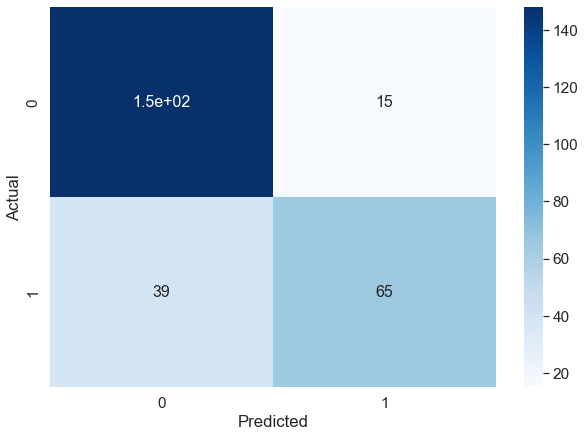

In [34]:
data = confusion_matrix(y_test, predictions)
df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(predictions))
df_cm.index.name = 'Actual'
df_cm.columns.name = 'Predicted'
plt.figure(figsize = (10,7))
sns.set(font_scale=1.4)#for label size
sns.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})

* The confusion matrix shows a matrix with the predicted classes in the x-axis and in the actual classes in the y-axis. The diagonal matrix represents the number of correct predictions for each class. One can see that clearly the model is able to predict the 0 class better than it can predict the 1 class. 

# Supplementary Activity:
* Choose your own dataset 
* Import the dataset 
* Determine the number of datapoints, columns and data types
* Remove unneccesary columns
* Do data cleaning such as removing empty values(NaN), replacing missing data .
* Perform descriptive statistics such as mean, median and mode
* Perform data visualization 
* Solve classification problem using Logistic Regression
* Evaluate the model using classification report, accuracy and confusion matrix

In [58]:
import pandas as pd
import numpy as np
import matplotlib
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [59]:
df = pd.read_csv(r"C:\Users\core i5\Documents\GitHub\DataScience\datascience\CPE 312\Logistic Regression, Decision Tree , Random Forest\data\Logistic Regression\weatherAUS.csv")

In [60]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


#### Objective(s):

This activity aims to solve classification problem using logistic regression

In [61]:
print(df.shape)

(145460, 23)


In [62]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

* Remove null values for RainToday and RainTomorrow since the latter is needed for training and testing and the former feels like a good predictor.

In [63]:
df.dropna(subset = ['RainToday','RainTomorrow'], inplace=True)

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 140787 entries, 0 to 145458
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           140787 non-null  object 
 1   Location       140787 non-null  object 
 2   MinTemp        140319 non-null  float64
 3   MaxTemp        140480 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81093 non-null   float64
 6   Sunshine       73982 non-null   float64
 7   WindGustDir    131624 non-null  object 
 8   WindGustSpeed  131682 non-null  float64
 9   WindDir9am     131127 non-null  object 
 10  WindDir3pm     137117 non-null  object 
 11  WindSpeed9am   139732 non-null  float64
 12  WindSpeed3pm   138256 non-null  float64
 13  Humidity9am    139270 non-null  float64
 14  Humidity3pm    137286 non-null  float64
 15  Pressure9am    127044 non-null  float64
 16  Pressure3pm    127018 non-null  float64
 17  Cloud9am       88162 non-null

In [65]:
px.histogram(df, x = 'Location', title='Location vs. Rainy Days', color ="RainToday")

    Data seems to be evely distributed. Cities generally get more rains than no. Additionally and generally, most cities experience 20% of the time with rain for the last 10 years.

In [66]:
px.histogram(df, x = 'RainTomorrow', title='RainTomorrow vs. Rainy Days', color ="RainToday")

More instances of <b>not raining today and not raining tomorrow</b> than other cases.

    So we can observes that AUS predictor for tomorrow not raining is if it did not rain yesterday. There seems to be no correlation to raining today and then raining tomorrow VS NOT raining today and then raining tomorrow. So this means using the RainToday predictor to whether it WILL rain tomorrow would be bad since there is no clear distinction that RainToday values reveals a tendency for it to rain tomorrow.

    TLDR: Predictor column 'RainToday' is better at predicting "No" for 'RainTomorrow' than predicting "Yes".

In [67]:
px.histogram(df, x = 'Temp3pm', title='Temp at 3pm vs. Rainy Days', color ="RainToday")

    We can see that usually there are more instances of "No" for "RainTomorrow" than "Yes" for any given temperature at 3PM. Most of the days experience an average temperature of 15-25 degreees celcius. It is also around these temperatures do we see the most amount of rainy days, even tho it is around these temps that we also see the most amount of non-rainy days. Higher temperatures of 35-45+ almost guarantee no rain.

In [68]:
px.scatter(df.sample(5000), x = 'MinTemp', y = 'MaxTemp', title="Minimum Temperature vs Maximum Temperature as predictor for tomorrow's rain", color ="RainToday", opacity=0.5)

    Generally, for the days with similar minimum temperatures, a higher maximum temperature seems to indicate that it will not rain on that day. The vertical shift of the otherwise similarly positioned scatter plot of the two predictor columns (with RainToday as indicated) is due to the fact that the higher maximum temperature is, the more likely to not rain on that day.

## Training, Validation, and Test sets

* training 60%
* validation 20%
* test 20%



In [69]:
from sklearn.model_selection import train_test_split

In [70]:
train_val_df , test_df = train_test_split(df, test_size=0.2, random_state=101)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=101)

Conclusion:

In [71]:
print("shape of train_df is {}".format(train_df.shape))
print("shape of validity_df is {}".format(val_df.shape))
print("shape of test_df is {}".format(test_df.shape))

shape of train_df is (84471, 23)
shape of validity_df is (28158, 23)
shape of test_df is (28158, 23)


Since we are working with data that involves time it is best that we don't train our model with dates that would appear in our validation and test dataset. Meaning one should not train models based on data that is in the future or will be included in the test/validation dataset.

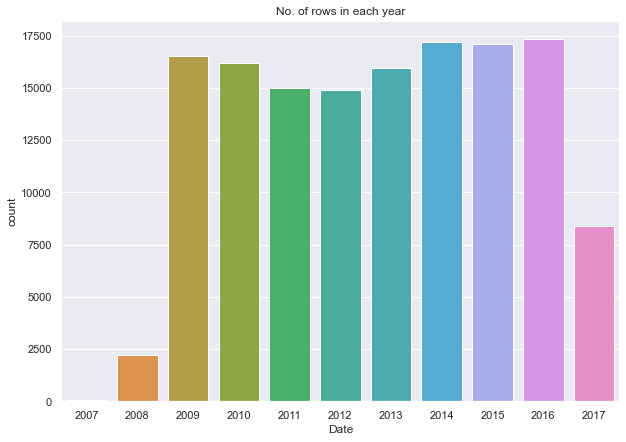

In [72]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(10,7))
sns.set_theme(style="darkgrid")
ax = sns.countplot(data = df,x= pd.to_datetime(df["Date"]).dt.year)
ax.set_title("No. of rows in each year");

 So the data for the test/training/validation will be broken down like this:
1. train_df will contain data points with years below 2015
2. val_df will contain data points with years equal to 2015
3. test_df will contain data points with years greater than 2015

In [73]:
year = pd.to_datetime(df["Date"]).dt.year
train_df = df[year < 2015]
val_df = df[year == 2015]
test_df = df[year > 2015]

In [74]:
print("shape of train_df is {}".format(train_df.shape))
print("shape of validity_df is {}".format(val_df.shape))
print("shape of test_df is {}".format(test_df.shape))

shape of train_df is (97988, 23)
shape of validity_df is (17089, 23)
shape of test_df is (25710, 23)


In [75]:
train_inputs = train_df.drop(['Date', 'RainTomorrow'], axis =1)
train_target = train_df["RainTomorrow"]

In [76]:
val_inputs = val_df.drop(['Date', 'RainTomorrow'], axis =1)
val_target = val_df["RainTomorrow"]
test_inputs = test_df.drop(['Date', 'RainTomorrow'], axis =1)
test_target = test_df["RainTomorrow"]

    collect all the columns that are numerical and categorical and put them into a list

In [77]:
num_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
cat_cols = train_inputs.select_dtypes(include=["object"]).columns.tolist()

In [78]:
train_inputs[num_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


In [79]:
train_inputs[cat_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

## Imputing missing data

In [80]:
from sklearn.impute import SimpleImputer

#create an imputer object
imputer = SimpleImputer(strategy="mean")

In [81]:
# check the columns that have nan values and how many
train_inputs[num_cols].isnull().sum()

MinTemp            314
MaxTemp            187
Rainfall             0
Evaporation      36331
Sunshine         40046
WindGustSpeed     6828
WindSpeed9am       874
WindSpeed3pm      1069
Humidity9am       1052
Humidity3pm       1116
Pressure9am       9112
Pressure3pm       9131
Cloud9am         34988
Cloud3pm         36022
Temp9am            574
Temp3pm            596
dtype: int64

In [82]:
# fit the imputer model to fill each column with missing values the mean value for that column
imputer.fit(train_inputs[num_cols])

SimpleImputer()

In [83]:
# the object imputer now contains an atribute called .statistics_ which contains the mean value for each column. We can access this:
list(imputer.statistics_)

[12.0078311526097,
 23.0222022269711,
 2.37293546148508,
 5.289991404057933,
 7.609003831417626,
 40.21587318999561,
 14.09226270156723,
 18.76460755888938,
 68.62874473879673,
 51.46954744404988,
 1017.5137337413925,
 1015.132351891241,
 4.302952380952381,
 4.410676822773779,
 16.835126367873205,
 21.54013779365862]

In [84]:
# we need to inject these values in the predictor variable for all our datasets.

train_inputs[num_cols] = imputer.transform(train_inputs[num_cols])
val_inputs[num_cols] = imputer.transform(val_inputs[num_cols])
test_inputs[num_cols] = imputer.transform(test_inputs[num_cols])

## Normalizing our Numerical columns

In [89]:
from sklearn.preprocessing import MinMaxScaler

#create an object for MinMaxScaler
scaler = MinMaxScaler()

#scaler.transform({data fram with num cols}) will result in the scaling of the values from (0,1)

train_inputs[num_cols] = scaler.fit_transform(train_inputs[num_cols])
val_inputs[num_cols] = scaler.fit_transform(val_inputs[num_cols])
test_inputs[num_cols] = scaler.fit_transform(test_inputs[num_cols])

In [91]:
# verify that the scaling worked (val_inputs is used to see the max and min but train_inputs and test_inputs both have a max of 1 and min of 0)
val_inputs[num_cols].describe().loc[["min","max"]]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


## Encoding Categorical Data

In [87]:
# check all of our categorical columns
train_inputs[cat_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [88]:
train_inputs[cat_cols].isnull().sum()

Location          0
WindGustDir    6868
WindDir9am     7019
WindDir3pm     1952
RainToday         0
dtype: int64

In [92]:
from sklearn.preprocessing import OneHotEncoder

In [94]:
# encoder object
encoder = OneHotEncoder(sparse = False, handle_unknown='ignore')

### Try to impute missing categorical values using logistic regression

In [ ]:
# Seperate the test, train, and val data into two dataframes: one w/ missing data and one w/o.

### Try to impute missing categorical values by inputting "Unknown"

In [95]:
test_df2 = test_df[cat_cols].fillna("Unknown")
train_df2 = train_df[cat_cols].fillna("Unknown")
val_df2 = val_df[cat_cols].fillna("Unknown")

In [96]:
#check to see if imputation works (val_df2 is shown here but test_df2 and train_df2 also are modified)
val_df2[cat_cols].isnull().sum()

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

In [97]:
# We must first fit our encoder object with our dataframe so it can recognize the categorical columns
encoder.fit(train_df2)

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [98]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'Unknown', 'W', 'WNW', 'WSW'], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'Unknown', 'W', 'WNW', 'WSW'], dtype=

In [99]:
# generate columns names to label our new one-hot encoded columns
encoded_cols = list(encoder.get_feature_names(cat_cols))
print(encoded_cols)

['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

In [100]:
# Now that we have generated the one-hot encoded columns, we shall append them to our train, validation, and test datasets
train_df2[encoded_cols] = encoder.transform(train_df2[cat_cols])
test_df2[encoded_cols] = encoder.transform(test_df2[cat_cols])
val_df2[encoded_cols] = encoder.transform(val_df2[cat_cols])

In [101]:
#same outputs for the train and validation datasets.
test_df2.columns

Index(['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday',
       'Location_Adelaide', 'Location_Albany', 'Location_Albury',
       'Location_AliceSprings', 'Location_BadgerysCreek',
       ...
       'WindDir3pm_SE', 'WindDir3pm_SSE', 'WindDir3pm_SSW', 'WindDir3pm_SW',
       'WindDir3pm_Unknown', 'WindDir3pm_W', 'WindDir3pm_WNW',
       'WindDir3pm_WSW', 'RainToday_No', 'RainToday_Yes'],
      dtype='object', length=107)

# type your conclusion here